#Import Libraries

In [ ]:
import cv2
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from google.colab.patches import cv2_imshow
import os

%matplotlib inline

import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
import torchvision

import torchvision.models as models

from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from sklearn.metrics import f1_score, confusion_matrix, classification_report
import numpy as np

#Dataset 1

## **About Dataset**


In [ ]:
!unzip '/content/drive/MyDrive/breastcancermasses.zip'

Streaming output truncated to the last 5000 lines.
  inflating: Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset/Malignant Masses/mdb134 (47).png  
  inflating: Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset/Malignant Masses/mdb134 (48).png  
  inflating: Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset/Malignant Masses/mdb134 (49).png  
  inflating: Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset/Malignant Masses/mdb134 (5).png  
  inflating: Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset/Malignant Masses/mdb

**Dataset Name:**
Breast mammography images with Masses
https://www.kaggle.com/datasets/tommyngx/breastcancermasses

---



---



The dataset contains mammography with benign and malignant masses. Images in this dataset were first extracted 106 masses images from INbreast dataset, 53 masses images from MIAS dataset, and 2188 masses images DDSM dataset. Then we use data augmentation and contrast-limited adaptive histogram equalization to preprocess our images. After data augmentation, Inbreast dataset has 7632 images, MIAS dataset has 3816 images, DDSM dataset has 13128 images. In addition, we also integrate INbreast, MIAS, DDSM together. All the images were resized to 227*227 pixels.

Dataset
http://medicalresearch.inescporto.pt/breastresearch/index.php/Get_INbreast_Database

Dataset of Breast mammography images with Masses
Published: 1 July 2020
DOI: 10.17632/ywsbh3ndr8.2
Contributors: Ting-Yu Lin, Mei-Ling Huang

## Data preparation

In [ ]:
ddsm_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/DDSM Dataset'
ddsm = glob.glob(ddsm_folder + "/**/*.png", recursive=True)

inbreast_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast Dataset'
inbreast = glob.glob(inbreast_folder + "/**/*.png", recursive=True)

mias_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/MIAS Dataset'
mias = glob.glob(mias_folder + "/**/*.png", recursive=True)

all_datasets_combine_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset'
all_datasets_combine = glob.glob(all_datasets_combine_folder + "/**/*.png", recursive=True)

In [ ]:
print(f"DDSM total dataset samples: {len(ddsm)}\n"
      f"INBreast total dataset samples: {len(inbreast)}\n"
      f"MIAS total dataset samples: {len(mias)}\n"
      f"DDSM+INBreast+MIAS total dataset samples: {len(all_datasets_combine)}")


DDSM total dataset samples: 13128
INBreast total dataset samples: 7632
MIAS total dataset samples: 3816
DDSM+INBreast+MIAS total dataset samples: 24576


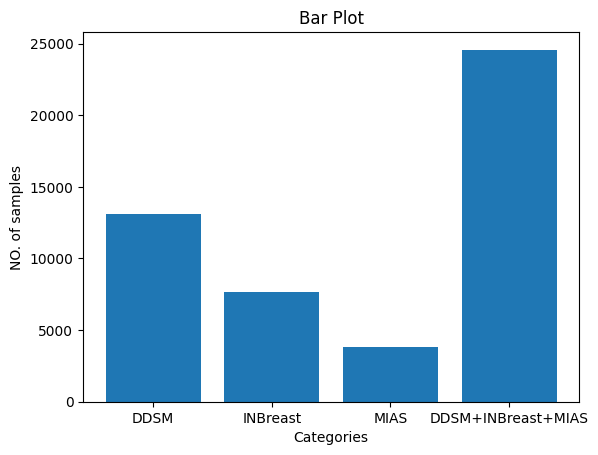

In [ ]:
plt.bar(['DDSM', 'INBreast', 'MIAS', 'DDSM+INBreast+MIAS'],
        [len(ddsm), len(inbreast), len(mias), len(all_datasets_combine)])
# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('Bar Plot')

# Show the plot
plt.show()

DDSM Image
Label of Image is: Malignant Masses


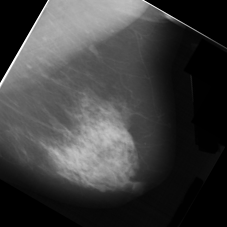

INBreast Image
Label of Image is: Malignant Masses


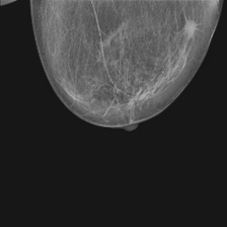

MIAS Image
Label of Image is: Malignant Masses


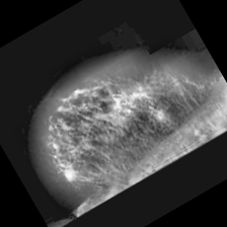

In [ ]:
for i in range(1):
    ddsm_img = cv2.imread(ddsm[i])
    ddsm_label = os.path.basename(os.path.dirname(ddsm[i]))
    print('DDSM Image\n'
          f'Label of Image is: {ddsm_label}')
    cv2_imshow(ddsm_img)

    inbreast_img = cv2.imread(inbreast[i])
    inbreast_label = os.path.basename(os.path.dirname(inbreast[i]))
    print('INBreast Image\n'
            f'Label of Image is: {inbreast_label}')
    cv2_imshow(inbreast_img)

    mias_img = cv2.imread(mias[i])
    mias_label = os.path.basename(os.path.dirname(mias[i]))
    print('MIAS Image\n'
          f'Label of Image is: {mias_label}')
    cv2_imshow(mias_img)

#Model Architecture (ResNet101)

In [ ]:
model = models.resnet101(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:03<00:00, 59.5MB/s]


In [ ]:
total_layers = len(list(model.parameters()))
freeze_layers = int(0.75 * total_layers)  # 75% of the layers to freeze

# Freeze the layers
for i, param in enumerate(model.parameters()):
    if i < freeze_layers:
        param.requires_grad = False


In [ ]:
num_classes = 2

# Replace the last fully connected layer
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

#DDSM dataset

DDSM datset
(Image shape)

It has the same shape as described in the dataset description

DDSM Image
Label of Image is: Benign Masses
Shape of Image is: (227, 227, 3)


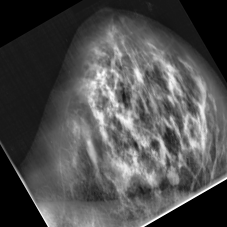

In [ ]:
ddsm_img = cv2.imread(ddsm[1])
ddsm_label = os.path.basename(os.path.dirname(ddsm[1]))
print('DDSM Image\n'
          f'Label of Image is: {ddsm_label}\n'
          f'Shape of Image is: {ddsm_img.shape}')
cv2_imshow(ddsm_img)

Samples per class

Classes are quite balanced as DDSM_BENIGN has 5970 samples and DDSM_MALIGNANT has 7158 samples

In [ ]:
ddsm_benign = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/DDSM Dataset/Benign Masses'
ddsm_benign_ = glob.glob(ddsm_benign + "/*.png", recursive=True)

ddsm_malignant = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/DDSM Dataset/Malignant Masses'
ddsm_malignant_ = glob.glob(ddsm_malignant + "/*.png", recursive=True)

In [ ]:
print(f"DDSM_BENIGN samples: {len(ddsm_benign_)}\n"
      f"DDSM_MALIGNANT samples: {len(ddsm_malignant_)}")

DDSM_BENIGN samples: 5970
DDSM_MALIGNANT samples: 7158


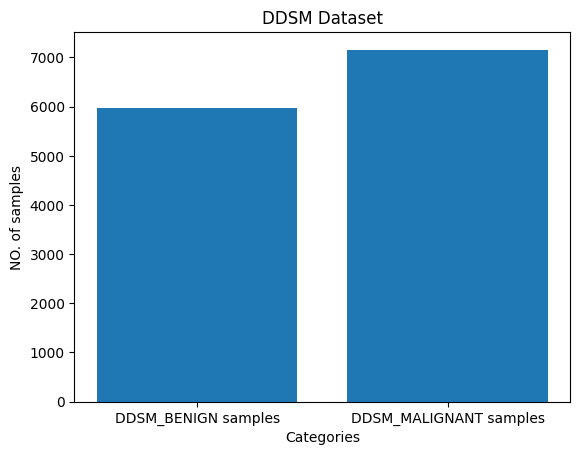

In [ ]:
plt.bar(['DDSM_BENIGN samples', 'DDSM_MALIGNANT samples'], [5970, 7158])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('DDSM Dataset')

# Show the plot
plt.show()

##Calculatig the mean and Standard Deviation

In [ ]:
# Define the root folder of your DDSM dataset
root_folder_s = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/DDSM Dataset'

# Define the transformation for your dataset without normalization
transform_without_normalization_s = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Create the ImageFolder dataset for calculating mean and std
train_dataset_s = ImageFolder(root=root_folder_s, transform=transform_without_normalization_s)

# Create a DataLoader for the training dataset
train_dataloader_s = DataLoader(train_dataset_s, batch_size=64, shuffle=True)

# Calculate the mean and standard deviation
mean_s = 0.
std_s = 0.
total_samples_s = 0

for images_s, _ in train_dataloader_s:
    batch_samples_s = images_s.size(0)
    images_s = images_s.view(batch_samples_s, images_s.size(1), -1)
    mean_s += images_s.mean(2).sum(0)
    std_s += images_s.std(2).sum(0)
    total_samples_s += batch_samples_s

mean_s /= total_samples_s
std_s /= total_samples_s

print("Mean:", mean_s)
print("Standard Deviation:", std_s)

Mean: tensor([0.2658, 0.2658, 0.2658])
Standard Deviation: tensor([0.2185, 0.2185, 0.2185])


##Dataset Class

In [ ]:
# Define the root folder of your DDSM dataset
root_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/DDSM Dataset'

# Define the transformations to be applied to the images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the image to a specific size
    transforms.ToTensor(),  # Convert the image to a tensor
    transforms.Normalize(mean=[0.2658, 0.2658, 0.2658], std=[0.2185, 0.2185, 0.2185])  # Normalize the image
])

# Create the ImageFolder dataset
dataset_ddsm = ImageFolder(root=root_folder, transform=transform)

# Split the dataset into training and test sets
train_size_ = int(0.8 * len(dataset_ddsm))  # 80% for training
test_size = len(dataset_ddsm) - train_size_  # Remaining 20% for validation
train_dataset, test_dataset_ddsm = torch.utils.data.random_split(dataset_ddsm, [train_size_, test_size])

# Split the dataset into training and validation sets
train_size = int(0.9 * len(train_dataset))  # 80% for training
valid_size = len(train_dataset) - train_size  # Remaining 20% for validation
train_dataset_ddsm, valid_dataset_ddsm = torch.utils.data.random_split(train_dataset, [train_size, valid_size])

# Create the DataLoader for training
train_dataloader_ddsm = DataLoader(train_dataset_ddsm, batch_size=64, shuffle=True)

# Create the DataLoader for validation
valid_dataloader_ddsm = DataLoader(valid_dataset_ddsm, batch_size=32, shuffle=False)

# Create the DataLoader for Testing
test_dataloader_ddsm = DataLoader(test_dataset_ddsm, batch_size=32, shuffle=False)


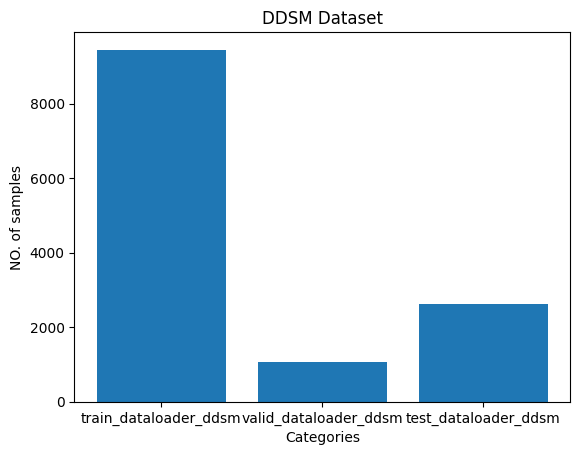

In [ ]:
plt.bar(['train_dataloader_ddsm', 'valid_dataloader_ddsm','test_dataloader_ddsm'],
        [len(train_dataloader_ddsm.dataset),
        len(valid_dataloader_ddsm.dataset), len(test_dataloader_ddsm.dataset)])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('DDSM Dataset')

# Show the plot
plt.show()

#Training on DDSM

In [ ]:
# Set the device to run on GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

model = model.to(device=device)

def train(num_epoch, model):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(0, num_epoch):
        model.train()
        loop = tqdm(enumerate(train_dataloader_ddsm), total=len(train_dataloader_ddsm.dataset))
        running_loss = 0.0
        corrects = 0
        total = 0

        for batch_idx, (data, targets) in loop:
            data = data.to(device=device)
            targets = targets.to(device=device)
            scores = model(data)

            loss = criterion(scores, targets)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            _, preds = torch.max(scores, 1)

            running_loss += loss.item() * data.size(0)
            corrects += torch.sum(preds == targets.data)
            total += targets.size(0)

            loop.set_description(f"Epoch {epoch+1}/{num_epoch}")


        # Calculate training loss and accuracy
        epoch_loss = running_loss / len(train_dataloader_ddsm.dataset)
        train_accuracy = corrects.double() / total

        # Validation
        model.eval()
        val_loss = 0.0
        val_corrects = 0.0
        with torch.no_grad():
            for val_data, val_targets in valid_dataloader_ddsm:
                val_data = val_data.to(device=device)
                val_targets = val_targets.to(device=device)
                val_scores = model(val_data)
                val_batch_loss = criterion(val_scores, val_targets)
                val_loss += val_batch_loss.item() * val_data.size(0)
                _, val_preds = torch.max(val_scores, 1)
                val_corrects += torch.sum(val_preds == val_targets.data)

        val_loss = val_loss / len(valid_dataloader_ddsm.dataset)
        val_accuracy = val_corrects.double() / len(valid_dataloader_ddsm.dataset)

        # loop.set_postfix(epoch_loss=epoch_loss, train_accuracy=train_accuracy,
        #                  val_loss=val_loss, val_accuracy=val_accuracy)

        print("Training Loss: {:.4f}".format(epoch_loss),"Validation Loss: {:.4f}".format(val_loss))
        print("Trai Accuracy: {:.4f}".format(train_accuracy),"Validatio Accuracy: {:.4f}".format(val_accuracy))


        train_losses.append(epoch_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy.item())
        val_accuracies.append(val_accuracy.item())


        # Save model
        torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }, 'checkpoint_epoch_' + str(epoch) + '.pt')

    # Plotting curves
    plt.plot(range(1, num_epoch+1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epoch+1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    plt.plot(range(1, num_epoch+1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epoch+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()


Epoch 1/5:   2%|▏         | 148/9451 [01:44<1:49:28,  1.42it/s]


Training Loss: 0.0011 Validation Loss: 0.0001
Trai Accuracy: 0.9998 Validatio Accuracy: 1.0000


Epoch 2/5:   2%|▏         | 148/9451 [01:43<1:47:58,  1.44it/s]


Training Loss: 0.0045 Validation Loss: 0.0202
Trai Accuracy: 0.9984 Validatio Accuracy: 0.9952


Epoch 3/5:   2%|▏         | 148/9451 [01:41<1:46:48,  1.45it/s]


Training Loss: 0.0011 Validation Loss: 0.0001
Trai Accuracy: 0.9998 Validatio Accuracy: 1.0000


Epoch 4/5:   2%|▏         | 148/9451 [01:42<1:47:07,  1.45it/s]


Training Loss: 0.0004 Validation Loss: 0.0000
Trai Accuracy: 0.9999 Validatio Accuracy: 1.0000


Epoch 5/5:   2%|▏         | 148/9451 [01:41<1:45:59,  1.46it/s]


Training Loss: 0.0001 Validation Loss: 0.0000
Trai Accuracy: 1.0000 Validatio Accuracy: 1.0000


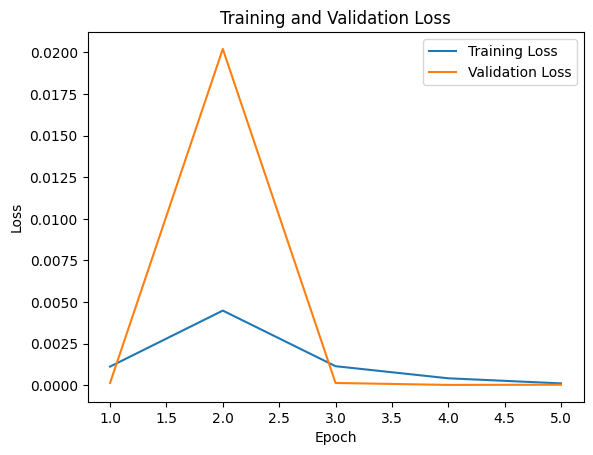

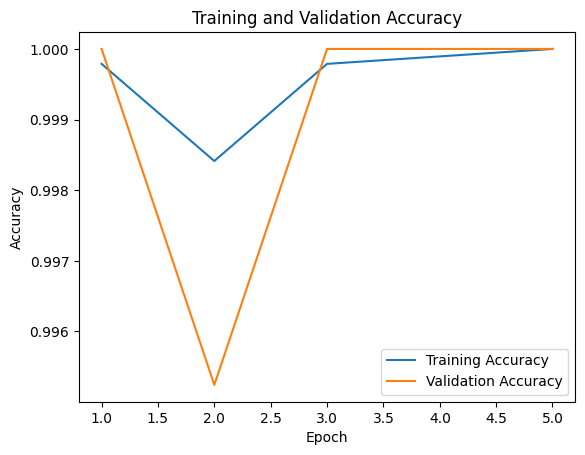

In [ ]:
train(5, model)

In [ ]:
!cp '/content/Breast_cancer_ddsm_100%.pt' '/content/drive/MyDrive'

#Testing on DDSM

In [ ]:
checkpoint = torch.load('/content/Breast_cancer_ddsm_100%.pt')  # Load the saved checkpoint file

model = models.resnet101(pretrained=True)  # Create an instance of the model
model.fc = torch.nn.Linear(model.fc.in_features, 2)

model.load_state_dict(checkpoint['model_state_dict'])  # Load the model's state dictionary

optimizer = optim.SGD(model.parameters(), lr=0.001)  # Create an instance of the optimizer
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])  # Load the optimizer's state dictionary

In [ ]:
def test(test_loader, model):
    model.to(device)
    model.eval()
    test_loss = 0
    correct = 0

    true_output = []
    pred_output = []
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.to(device)
            true_output.extend(y.tolist())

            output = model(x)
            _, predictions = torch.max(output, 1)
            pred_output.extend(predictions.tolist())

            correct += (predictions == y).sum().item()
            test_loss += criterion(output, y)

            # Display the image, predicted label, and actual label
            for i in range(len(x)):
                if i % 1000 == 0:
                    image = x[i].cpu().numpy()
                    predicted_label = predictions[i].item()
                    actual_label = y[i].item()

                    plt.imshow(np.transpose(image, (1, 2, 0)))
                    plt.title(f"Predicted: {predicted_label}, Actual: {actual_label}")

                    plt.show()

    test_loss /= len(test_loader.dataset)

    print("Average Loss: ", test_loss, "  Accuracy: ", correct, " / ",
    len(test_loader.dataset), "  ", int(correct / len(test_loader.dataset) * 100), "%")

    Confusion_matrix = confusion_matrix(true_output, pred_output)
    report = classification_report(true_output, pred_output)
    F1_score = f1_score(true_output, pred_output, average='macro')

    print('F1 Score is: {}'.format(F1_score))
    print('Classification_Report Score is: {}'.format(report))


    fig = plt.figure(figsize=(15,5))
    sns.heatmap(Confusion_matrix, annot=True, cmap='Blues')
    plt.show()


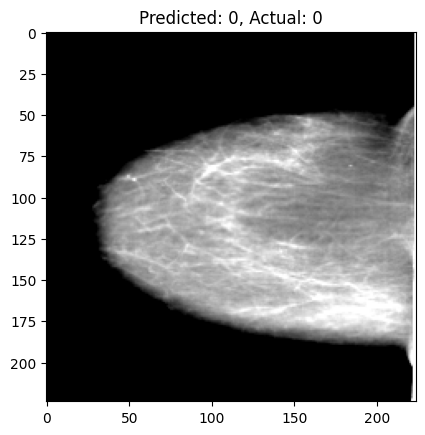

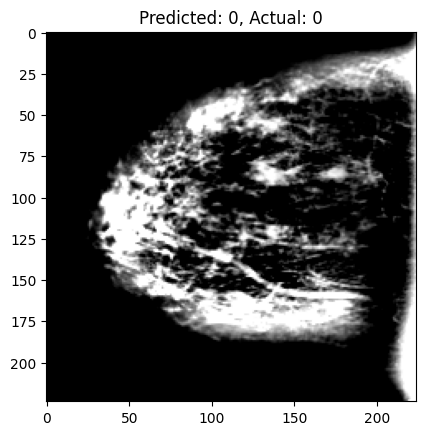

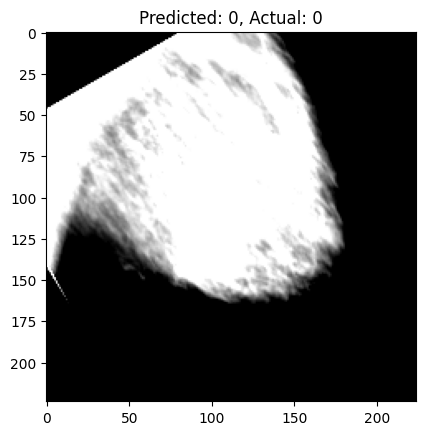

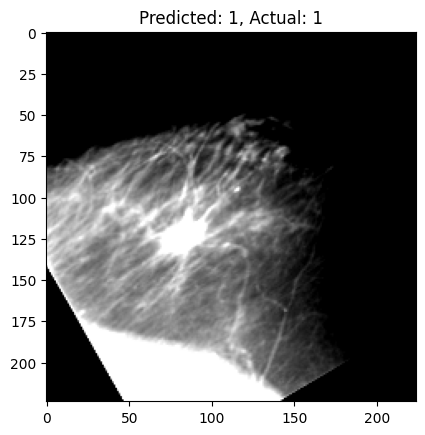

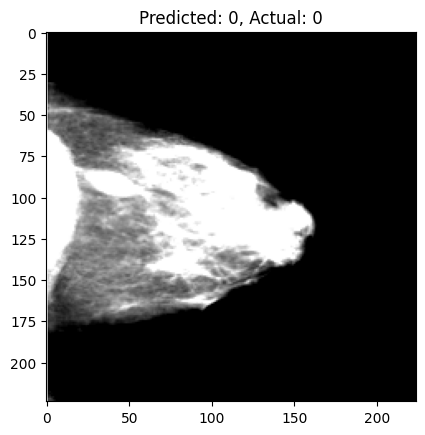

...

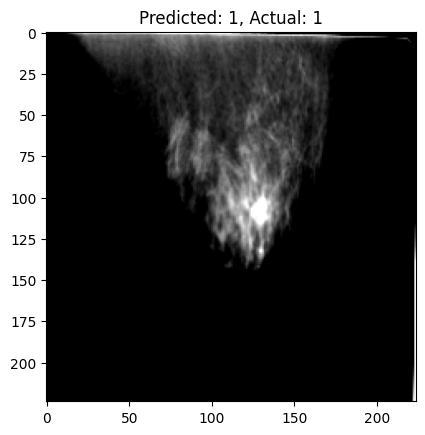

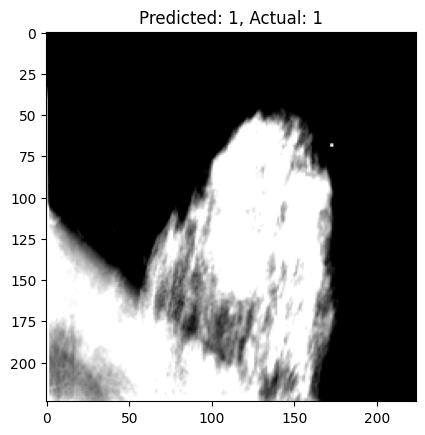

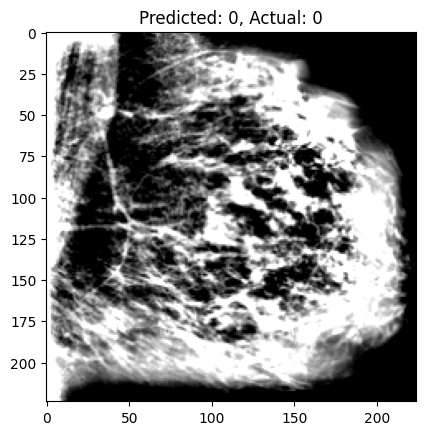

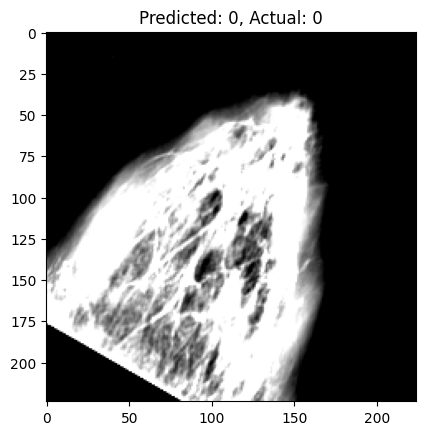

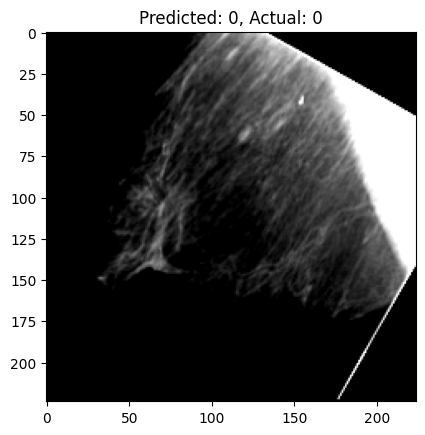

Average Loss:  tensor(8.7758e-05, device='cuda:0')   Accuracy:  2625  /  2626    99 %
F1 Score is: 0.9996178266268891
Classification_Report Score is:               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1234
           1       1.00      1.00      1.00      1392

    accuracy                           1.00      2626
   macro avg       1.00      1.00      1.00      2626
weighted avg       1.00      1.00      1.00      2626



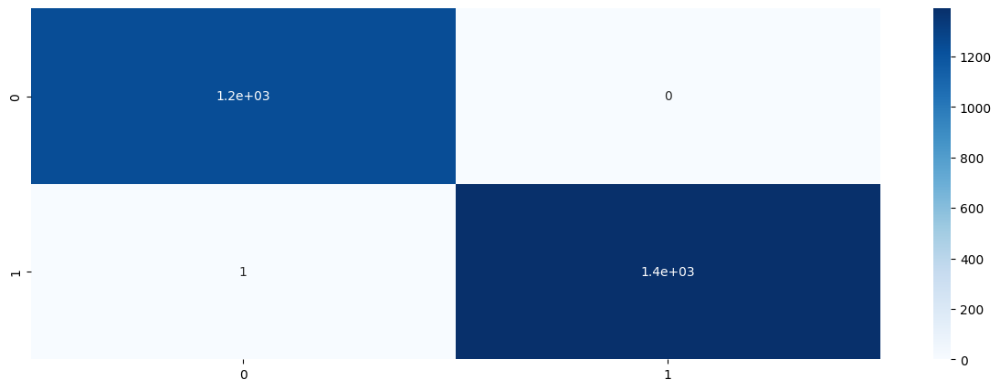

In [ ]:
test(test_dataloader_ddsm,model)

#INbreast dataset

INbreast datset
(Image shape)

It has the same shape as described in the dataset description

INbreast Image
Label of Image is: Benign Masses
Shape of Image is: (227, 227, 3)


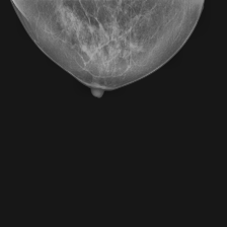

In [ ]:
inbreast_img = cv2.imread(inbreast[1])
inbreast_label = os.path.basename(os.path.dirname(inbreast[1]))
print('INbreast Image\n'
          f'Label of Image is: {inbreast_label}\n'
          f'Shape of Image is: {inbreast_img.shape}')
cv2_imshow(inbreast_img)

Samples per class

In [ ]:
inbreast_benign = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast Dataset/Benign Masses'
inbreast_benign_ = glob.glob(inbreast_benign + "/*.png", recursive=True)

inbreast_malignant = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast Dataset/Malignant Masses'
inbreast_malignant_ = glob.glob(inbreast_malignant + "/*.png", recursive=True)

In [ ]:
print(f"INbreast_BENIGN samples: {len(inbreast_benign_)}\n"
      f"INbreast_MALIGNANT samples: {len(inbreast_malignant_)}")

INbreast_BENIGN samples: 2520
INbreast_MALIGNANT samples: 5112


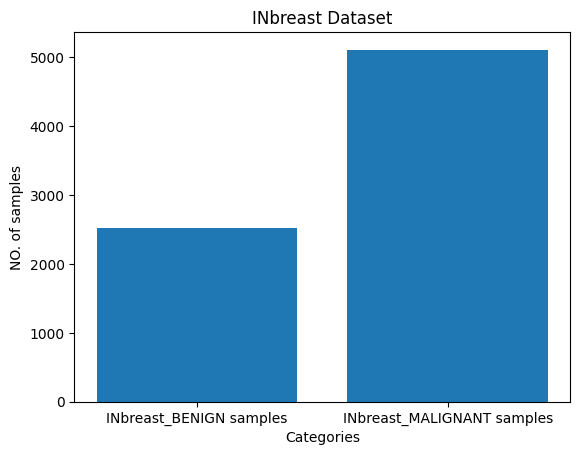

In [ ]:
plt.bar(['INbreast_BENIGN samples', 'INbreast_MALIGNANT samples'], [len(inbreast_benign_), len(inbreast_malignant_)])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('INbreast Dataset')

# Show the plot
plt.show()

##Calculatig the mean and Standard Deviation

In [ ]:
# Define the root folder of your DDSM dataset
root_folder_s = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast Dataset'

# Define the transformation for your dataset without normalization
transform_without_normalization_s = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Create the ImageFolder dataset for calculating mean and std
train_dataset_s = ImageFolder(root=root_folder_s, transform=transform_without_normalization_s)

# Create a DataLoader for the training dataset
train_dataloader_s = DataLoader(train_dataset_s, batch_size=64, shuffle=True)

# Calculate the mean and standard deviation
mean_s = 0.
std_s = 0.
total_samples_s = 0

for images_s, _ in train_dataloader_s:
    batch_samples_s = images_s.size(0)
    images_s = images_s.view(batch_samples_s, images_s.size(1), -1)
    mean_s += images_s.mean(2).sum(0)
    std_s += images_s.std(2).sum(0)
    total_samples_s += batch_samples_s

mean_s /= total_samples_s
std_s /= total_samples_s

print("Mean:", mean_s)
print("Standard Deviation:", std_s)

Mean: tensor([0.1455, 0.1455, 0.1455])
Standard Deviation: tensor([0.1640, 0.1640, 0.1640])


##Dataset Class

In [ ]:
# Define the root folder of your DDSM dataset
root_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast Dataset'

# Define the transformations to be applied to the images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the image to a specific size
    transforms.ToTensor(),  # Convert the image to a tensor
    transforms.Normalize(mean=[0.1455, 0.1455, 0.1455], std=[0.1640, 0.1640, 0.1640])  # Normalize the image
])

# Create the ImageFolder dataset
dataset_inbreast = ImageFolder(root=root_folder, transform=transform)

# Split the dataset into training and test sets
train_size_ = int(0.8 * len(dataset_inbreast))  # 80% for training
test_size = len(dataset_inbreast) - train_size_  # Remaining 20% for validation
train_dataset, test_dataset_inbreast = torch.utils.data.random_split(dataset_inbreast, [train_size_, test_size])

# Split the dataset into training and validation sets
train_size = int(0.9 * len(train_dataset))  # 80% for training
valid_size = len(train_dataset) - train_size  # Remaining 20% for validation
train_dataset_inbreast, valid_dataset_inbreast = torch.utils.data.random_split(train_dataset, [train_size, valid_size])

# Create the DataLoader for training
train_dataloader_inbreast = DataLoader(train_dataset_inbreast, batch_size=64, shuffle=True)

# Create the DataLoader for validation
valid_dataloader_inbreast = DataLoader(valid_dataset_inbreast, batch_size=32, shuffle=False)

# Create the DataLoader for Testing
test_dataloader_inbreast = DataLoader(test_dataset_inbreast, batch_size=32, shuffle=False)


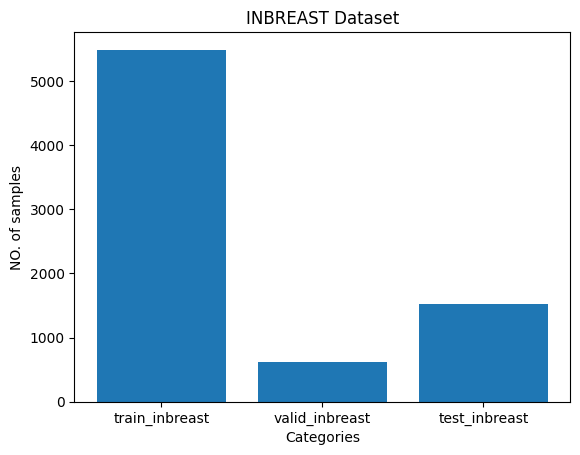

In [ ]:
plt.bar(['train_inbreast', 'valid_inbreast','test_inbreast'],
        [len(train_dataloader_inbreast.dataset),
        len(valid_dataloader_inbreast.dataset), len(test_dataloader_inbreast.dataset)])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('INBREAST Dataset')

# Show the plot
plt.show()

#Training on INBREAST

In [ ]:
# Set the device to run on GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

model = model.to(device=device)

def train(num_epoch, model):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(0, num_epoch):
        model.train()
        loop = tqdm(enumerate(train_dataloader_inbreast), total=len(train_dataloader_inbreast.dataset))
        running_loss = 0.0
        corrects = 0
        total = 0

        for batch_idx, (data, targets) in loop:
            data = data.to(device=device)
            targets = targets.to(device=device)
            scores = model(data)

            loss = criterion(scores, targets)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            _, preds = torch.max(scores, 1)

            running_loss += loss.item() * data.size(0)
            corrects += torch.sum(preds == targets.data)
            total += targets.size(0)

            loop.set_description(f"Epoch {epoch+1}/{num_epoch}")


        # Calculate training loss and accuracy
        epoch_loss = running_loss / len(train_dataloader_inbreast.dataset)
        train_accuracy = corrects.double() / total

        # Validation
        model.eval()
        val_loss = 0.0
        val_corrects = 0.0
        with torch.no_grad():
            for val_data, val_targets in valid_dataloader_inbreast:
                val_data = val_data.to(device=device)
                val_targets = val_targets.to(device=device)
                val_scores = model(val_data)
                val_batch_loss = criterion(val_scores, val_targets)
                val_loss += val_batch_loss.item() * val_data.size(0)
                _, val_preds = torch.max(val_scores, 1)
                val_corrects += torch.sum(val_preds == val_targets.data)

        val_loss = val_loss / len(valid_dataloader_inbreast.dataset)
        val_accuracy = val_corrects.double() / len(valid_dataloader_inbreast.dataset)

        # loop.set_postfix(epoch_loss=epoch_loss, train_accuracy=train_accuracy,
        #                  val_loss=val_loss, val_accuracy=val_accuracy)

        print("Training Loss: {:.4f}".format(epoch_loss),"Validation Loss: {:.4f}".format(val_loss))
        print("Trai Accuracy: {:.4f}".format(train_accuracy),"Validatio Accuracy: {:.4f}".format(val_accuracy))


        train_losses.append(epoch_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy.item())
        val_accuracies.append(val_accuracy.item())


        # Save model
        torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }, 'checkpoint_epoch_' + str(epoch) + '.pt')

    # Plotting curves
    plt.plot(range(1, num_epoch+1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epoch+1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    plt.plot(range(1, num_epoch+1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epoch+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()


Epoch 1/5:   2%|▏         | 86/5494 [00:55<58:37,  1.54it/s]


Training Loss: 0.4017 Validation Loss: 0.4796
Trai Accuracy: 0.8114 Validatio Accuracy: 0.8134


Epoch 2/5:   2%|▏         | 86/5494 [00:59<1:02:46,  1.44it/s]


Training Loss: 0.1467 Validation Loss: 0.0864
Trai Accuracy: 0.9434 Validatio Accuracy: 0.9673


Epoch 3/5:   2%|▏         | 86/5494 [01:03<1:06:34,  1.35it/s]


Training Loss: 0.0555 Validation Loss: 0.0564
Trai Accuracy: 0.9820 Validatio Accuracy: 0.9804


Epoch 4/5:   2%|▏         | 86/5494 [00:57<1:00:07,  1.50it/s]


Training Loss: 0.0397 Validation Loss: 0.3408
Trai Accuracy: 0.9867 Validatio Accuracy: 0.8707


Epoch 5/5:   2%|▏         | 86/5494 [00:57<59:58,  1.50it/s]  


Training Loss: 0.0378 Validation Loss: 0.0739
Trai Accuracy: 0.9878 Validatio Accuracy: 0.9820


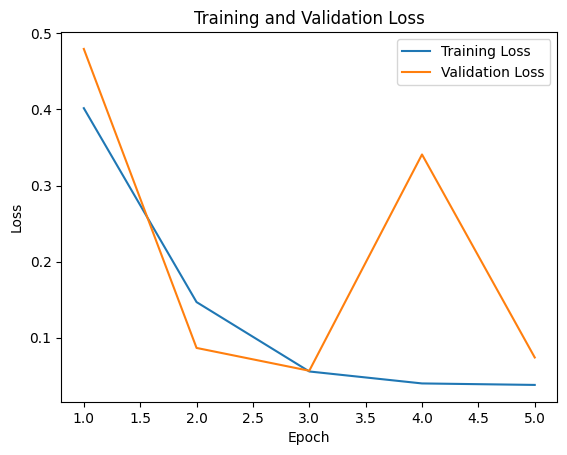

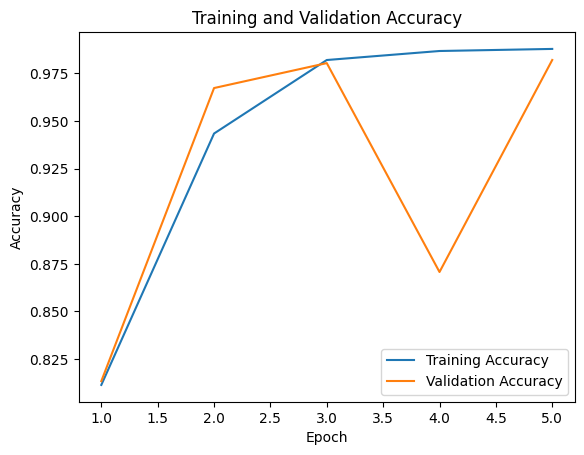

In [ ]:
train(5, model)

In [ ]:
!cp '/content/checkpoint_epoch_4.pt' '/content/drive/MyDrive'

#Testing on INBREAST

In [ ]:
checkpoint = torch.load('/content/checkpoint_epoch_4.pt')  # Load the saved checkpoint file

model = models.resnet101(pretrained=True)  # Create an instance of the model
model.fc = torch.nn.Linear(model.fc.in_features, 2)

model.load_state_dict(checkpoint['model_state_dict'])  # Load the model's state dictionary

optimizer = optim.SGD(model.parameters(), lr=0.001)  # Create an instance of the optimizer
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])  # Load the optimizer's state dictionary

In [ ]:
def test(test_loader, model):
    model.to(device)
    model.eval()
    test_loss = 0
    correct = 0

    true_output = []
    pred_output = []
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.to(device)
            true_output.extend(y.tolist())

            output = model(x)
            _, predictions = torch.max(output, 1)
            pred_output.extend(predictions.tolist())

            correct += (predictions == y).sum().item()
            test_loss += criterion(output, y)

            # Display the image, predicted label, and actual label
            for i in range(len(x)):
                if i % 1000 == 0:
                    image = x[i].cpu().numpy()
                    predicted_label = predictions[i].item()
                    actual_label = y[i].item()

                    plt.imshow(np.transpose(image, (1, 2, 0)))
                    plt.title(f"Predicted: {predicted_label}, Actual: {actual_label}")

                    plt.show()

    test_loss /= len(test_loader.dataset)

    print("Average Loss: ", test_loss, "  Accuracy: ", correct, " / ",
    len(test_loader.dataset), "  ", int(correct / len(test_loader.dataset) * 100), "%")

    Confusion_matrix = confusion_matrix(true_output, pred_output)
    report = classification_report(true_output, pred_output)
    F1_score = f1_score(true_output, pred_output, average='macro')

    print('F1 Score is: {}'.format(F1_score))
    print('Classification_Report Score is: {}'.format(report))


    fig = plt.figure(figsize=(15,5))
    sns.heatmap(Confusion_matrix, annot=True, cmap='Blues')
    plt.show()


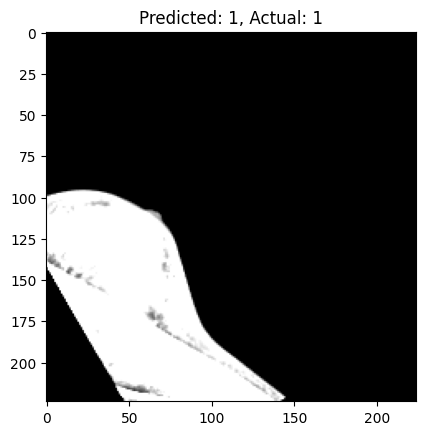

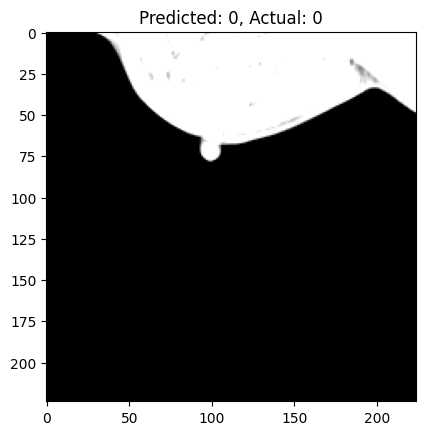

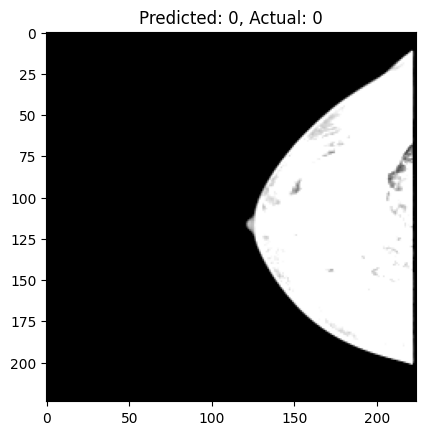

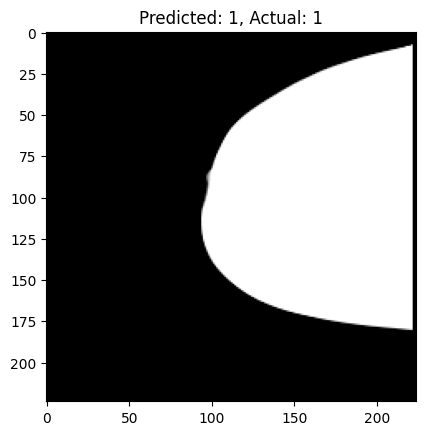

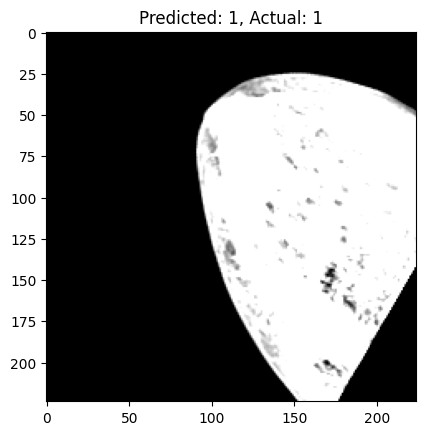

...

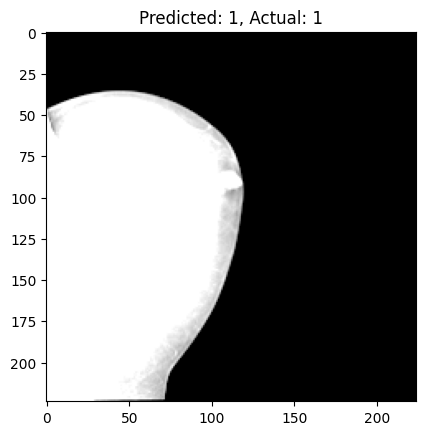

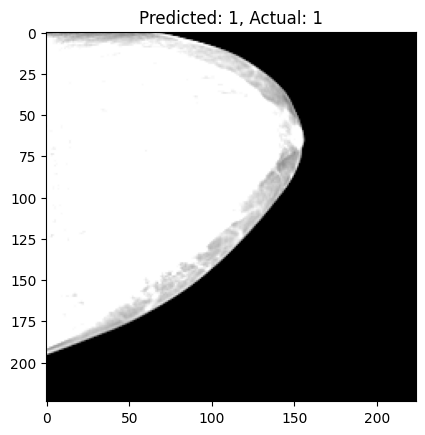

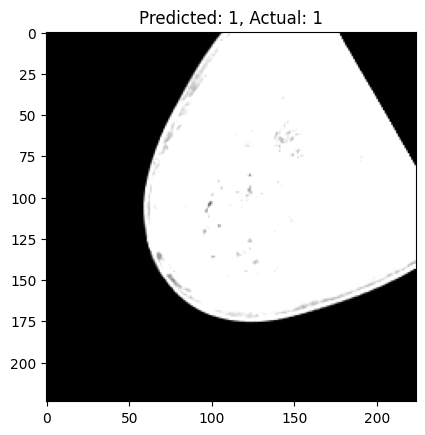

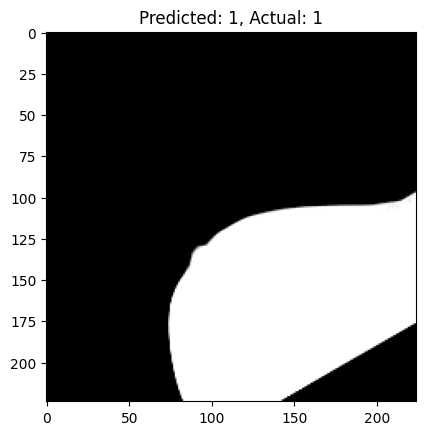

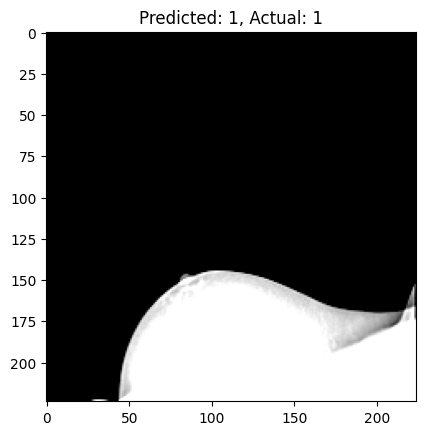

Average Loss:  tensor(0.0025, device='cuda:0')   Accuracy:  600  /  611    98 %
F1 Score is: 0.980114031428174
Classification_Report Score is:               precision    recall  f1-score   support

           0       0.97      0.98      0.97       210
           1       0.99      0.98      0.99       401

    accuracy                           0.98       611
   macro avg       0.98      0.98      0.98       611
weighted avg       0.98      0.98      0.98       611



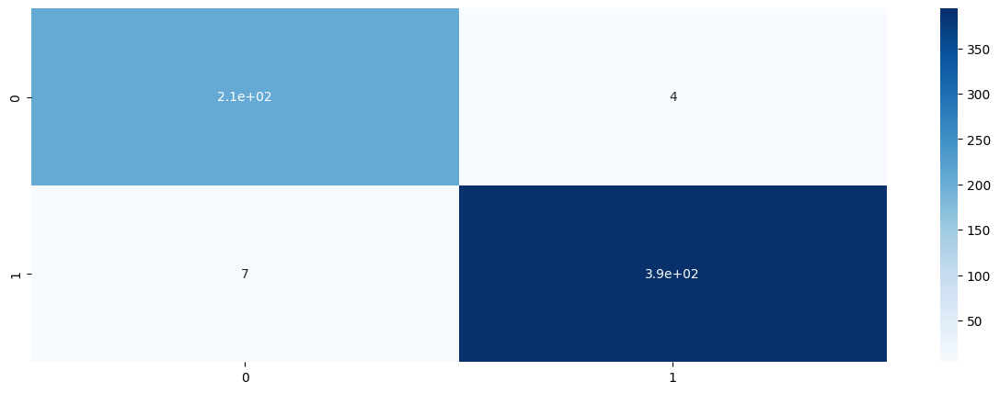

In [ ]:
test(valid_dataloader_inbreast,model)

#MIAS dataset

MIAS datset
(Image shape)

It has the same shape as described in the dataset description

MIAS Image
Label of Image is: Malignant Masses
Shape of Image is: (227, 227, 3)


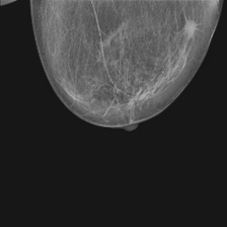

In [ ]:
mias_img = cv2.imread(mias[1])
mias_label = os.path.basename(os.path.dirname(inbreast[1]))
print('MIAS Image\n'
          f'Label of Image is: {mias_label}\n'
          f'Shape of Image is: {mias_img.shape}')
cv2_imshow(inbreast_img)

Samples per class

In [ ]:
mias_benign = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/MIAS Dataset/Benign Masses'
mias_benign_ = glob.glob(mias_benign + "/*.png", recursive=True)

mias_malignant = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/MIAS Dataset/Malignant Masses'
mias_malignant_ = glob.glob(mias_malignant + "/*.png", recursive=True)

In [ ]:
print(f"mias_BENIGN samples: {len(mias_benign_)}\n"
      f"mias_MALIGNANT samples: {len(mias_malignant_)}")

mias_BENIGN samples: 2376
mias_MALIGNANT samples: 1440


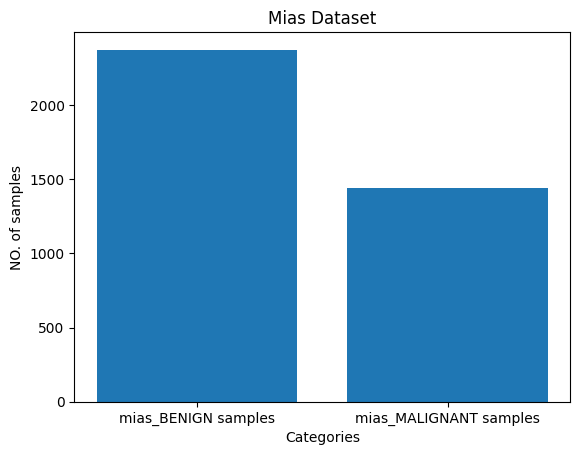

In [ ]:
plt.bar(['mias_BENIGN samples', 'mias_MALIGNANT samples'], [len(mias_benign_), len(mias_malignant_)])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('Mias Dataset')

# Show the plot
plt.show()

##Calculatig the mean and Standard Deviation

In [ ]:
# Define the root folder of your DDSM dataset
root_folder_s = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/MIAS Dataset'

# Define the transformation for your dataset without normalization
transform_without_normalization_s = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Create the ImageFolder dataset for calculating mean and std
train_dataset_s = ImageFolder(root=root_folder_s, transform=transform_without_normalization_s)

# Create a DataLoader for the training dataset
train_dataloader_s = DataLoader(train_dataset_s, batch_size=64, shuffle=True)

# Calculate the mean and standard deviation
mean_s = 0.
std_s = 0.
total_samples_s = 0

for images_s, _ in train_dataloader_s:
    batch_samples_s = images_s.size(0)
    images_s = images_s.view(batch_samples_s, images_s.size(1), -1)
    mean_s += images_s.mean(2).sum(0)
    std_s += images_s.std(2).sum(0)
    total_samples_s += batch_samples_s

mean_s /= total_samples_s
std_s /= total_samples_s

print("Mean:", mean_s)
print("Standard Deviation:", std_s)

Mean: tensor([0.2296, 0.2296, 0.2296])
Standard Deviation: tensor([0.2463, 0.2463, 0.2463])


##Dataset Class

In [ ]:
# Define the root folder of your DDSM dataset
root_folder = '/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/MIAS Dataset'

# Define the transformations to be applied to the images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the image to a specific size
    transforms.ToTensor(),  # Convert the image to a tensor
    transforms.Normalize(mean=[0.2296, 0.2296, 0.2296], std=[0.2463, 0.2463, 0.2463])  # Normalize the image
])

# Create the ImageFolder dataset
dataset_mias = ImageFolder(root=root_folder, transform=transform)

# Split the dataset into training and test sets
train_size_ = int(0.8 * len(dataset_mias))  # 80% for training
test_size = len(dataset_mias) - train_size_  # Remaining 20% for validation
train_dataset, test_dataset_mias = torch.utils.data.random_split(dataset_mias, [train_size_, test_size])

# Split the dataset into training and validation sets
train_size = int(0.9 * len(train_dataset))  # 80% for training
valid_size = len(train_dataset) - train_size  # Remaining 20% for validation
train_dataset_mias, valid_dataset_mias = torch.utils.data.random_split(train_dataset, [train_size, valid_size])

# Create the DataLoader for training
train_dataloader_mias = DataLoader(train_dataset_mias, batch_size=64, shuffle=True)

# Create the DataLoader for validation
valid_dataloader_mias = DataLoader(valid_dataset_mias, batch_size=32, shuffle=False)

# Create the DataLoader for Testing
test_dataloader_mias = DataLoader(test_dataset_mias, batch_size=32, shuffle=False)


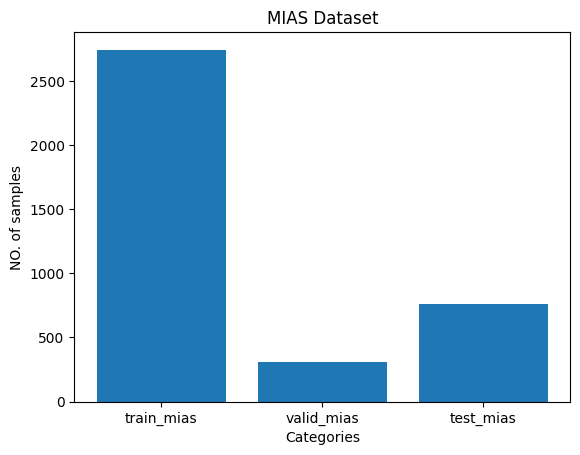

In [ ]:
plt.bar(['train_mias', 'valid_mias','test_mias'],
        [len(train_dataloader_mias.dataset),
        len(valid_dataloader_mias.dataset), len(test_dataloader_mias.dataset)])

# Set labels and title
plt.xlabel('Categories')
plt.ylabel('NO. of samples')
plt.title('MIAS Dataset')

# Show the plot
plt.show()

#Training on MIAS

In [ ]:
# Set the device to run on GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

model = model.to(device=device)

def train(num_epoch, model):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(0, num_epoch):
        model.train()
        loop = tqdm(enumerate(train_dataloader_mias), total=len(train_dataloader_mias.dataset))
        running_loss = 0.0
        corrects = 0
        total = 0

        for batch_idx, (data, targets) in loop:
            data = data.to(device=device)
            targets = targets.to(device=device)
            scores = model(data)

            loss = criterion(scores, targets)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            _, preds = torch.max(scores, 1)

            running_loss += loss.item() * data.size(0)
            corrects += torch.sum(preds == targets.data)
            total += targets.size(0)

            loop.set_description(f"Epoch {epoch+1}/{num_epoch}")


        # Calculate training loss and accuracy
        epoch_loss = running_loss / len(train_dataloader_mias.dataset)
        train_accuracy = corrects.double() / total

        # Validation
        model.eval()
        val_loss = 0.0
        val_corrects = 0.0
        with torch.no_grad():
            for val_data, val_targets in valid_dataloader_mias:
                val_data = val_data.to(device=device)
                val_targets = val_targets.to(device=device)
                val_scores = model(val_data)
                val_batch_loss = criterion(val_scores, val_targets)
                val_loss += val_batch_loss.item() * val_data.size(0)
                _, val_preds = torch.max(val_scores, 1)
                val_corrects += torch.sum(val_preds == val_targets.data)

        val_loss = val_loss / len(valid_dataloader_mias.dataset)
        val_accuracy = val_corrects.double() / len(valid_dataloader_mias.dataset)

        # loop.set_postfix(epoch_loss=epoch_loss, train_accuracy=train_accuracy,
        #                  val_loss=val_loss, val_accuracy=val_accuracy)

        print("Training Loss: {:.4f}".format(epoch_loss),"Validation Loss: {:.4f}".format(val_loss))
        print("Trai Accuracy: {:.4f}".format(train_accuracy),"Validatio Accuracy: {:.4f}".format(val_accuracy))


        train_losses.append(epoch_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy.item())
        val_accuracies.append(val_accuracy.item())


        # Save model
        torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }, 'checkpoint_epoch_' + str(epoch) + '.pt')

    # Plotting curves
    plt.plot(range(1, num_epoch+1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epoch+1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    plt.plot(range(1, num_epoch+1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, num_epoch+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()


Epoch 1/5:   2%|▏         | 43/2746 [00:41<43:18,  1.04it/s]


Training Loss: 0.5331 Validation Loss: 0.8493
Trai Accuracy: 0.7527 Validatio Accuracy: 0.6438


Epoch 2/5:   2%|▏         | 43/2746 [00:27<29:18,  1.54it/s]


Training Loss: 0.1340 Validation Loss: 0.8877
Trai Accuracy: 0.9523 Validatio Accuracy: 0.7680


Epoch 3/5:   2%|▏         | 43/2746 [00:28<29:50,  1.51it/s]


Training Loss: 0.0719 Validation Loss: 0.1988
Trai Accuracy: 0.9745 Validatio Accuracy: 0.9216


Epoch 4/5:   2%|▏         | 43/2746 [00:28<30:14,  1.49it/s]


Training Loss: 0.0408 Validation Loss: 0.0178
Trai Accuracy: 0.9858 Validatio Accuracy: 0.9935


Epoch 5/5:   2%|▏         | 43/2746 [00:29<31:00,  1.45it/s]


Training Loss: 0.0052 Validation Loss: 0.0243
Trai Accuracy: 0.9985 Validatio Accuracy: 0.9935


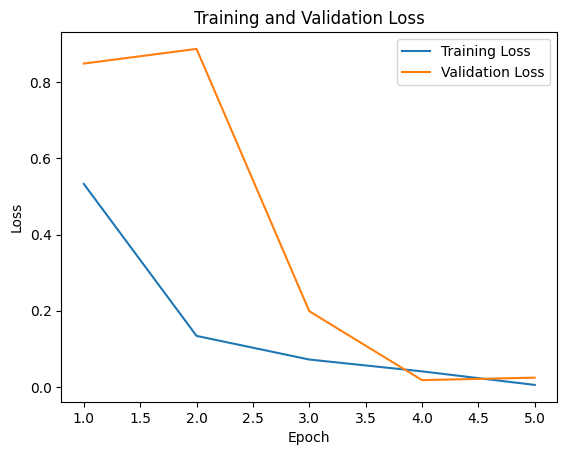

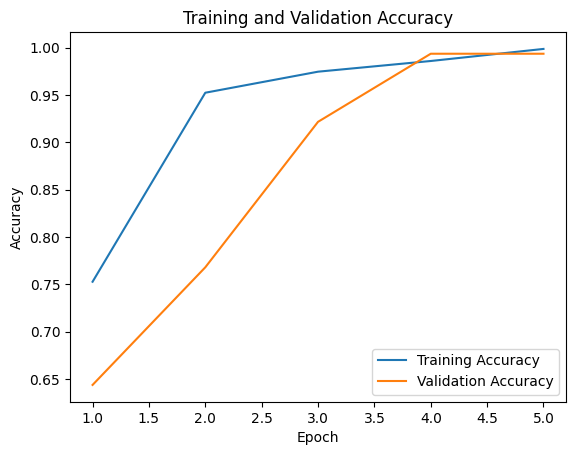

In [ ]:
train(5, model)

In [ ]:
!cp '/content/checkpoint_epoch_4.pt' '/content/drive/MyDrive'

#Testing on MIAS

In [ ]:
checkpoint = torch.load('/content/checkpoint_epoch_4.pt')  # Load the saved checkpoint file

model = models.resnet101(pretrained=True)  # Create an instance of the model
model.fc = torch.nn.Linear(model.fc.in_features, 2)

model.load_state_dict(checkpoint['model_state_dict'])  # Load the model's state dictionary

optimizer = optim.SGD(model.parameters(), lr=0.001)  # Create an instance of the optimizer
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])  # Load the optimizer's state dictionary

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def test(test_loader, model):
    model.to(device)
    model.eval()
    test_loss = 0
    correct = 0

    true_output = []
    pred_output = []
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.to(device)
            true_output.extend(y.tolist())

            output = model(x)
            _, predictions = torch.max(output, 1)
            pred_output.extend(predictions.tolist())

            correct += (predictions == y).sum().item()
            test_loss += criterion(output, y)

            # Display the image, predicted label, and actual label
            for i in range(len(x)):
                if i % 1000 == 0:
                    image = x[i].cpu().numpy()
                    predicted_label = predictions[i].item()
                    actual_label = y[i].item()

                    plt.imshow(np.transpose(image, (1, 2, 0)))
                    plt.title(f"Predicted: {predicted_label}, Actual: {actual_label}")

                    plt.show()

    test_loss /= len(test_loader.dataset)

    print("Average Loss: ", test_loss, "  Accuracy: ", correct, " / ",
    len(test_loader.dataset), "  ", int(correct / len(test_loader.dataset) * 100), "%")

    Confusion_matrix = confusion_matrix(true_output, pred_output)
    report = classification_report(true_output, pred_output)
    F1_score = f1_score(true_output, pred_output, average='macro')

    print('F1 Score is: {}'.format(F1_score))
    print('Classification_Report Score is: {}'.format(report))


    fig = plt.figure(figsize=(15,5))
    sns.heatmap(Confusion_matrix, annot=True, cmap='Blues')
    plt.show()


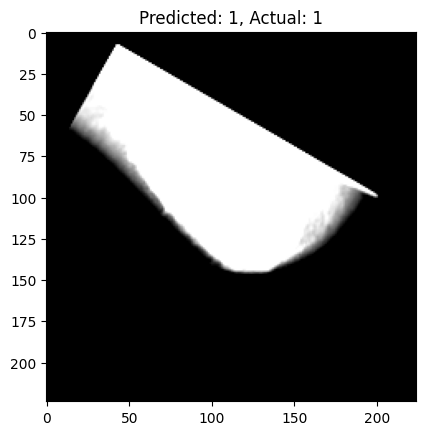

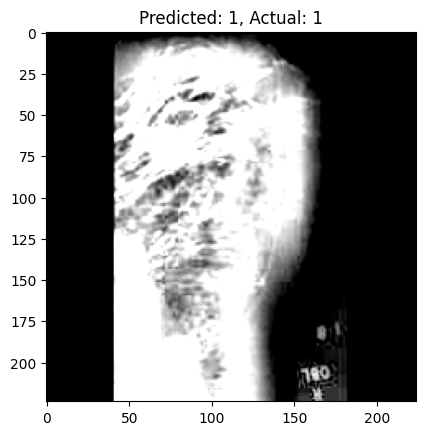

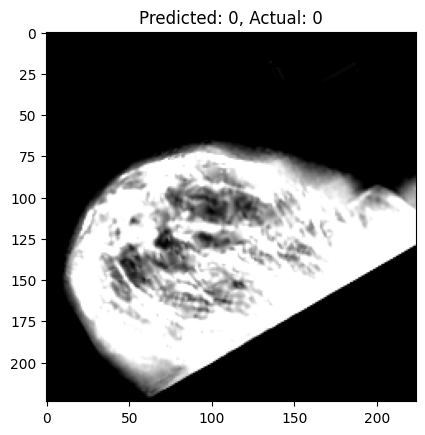

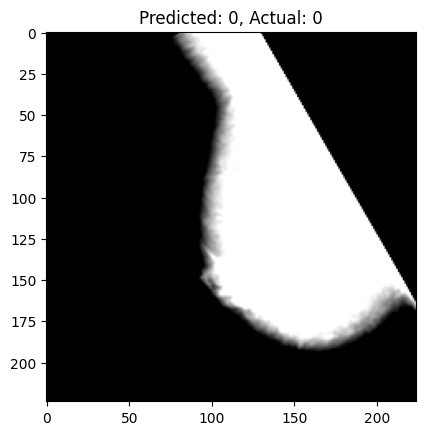

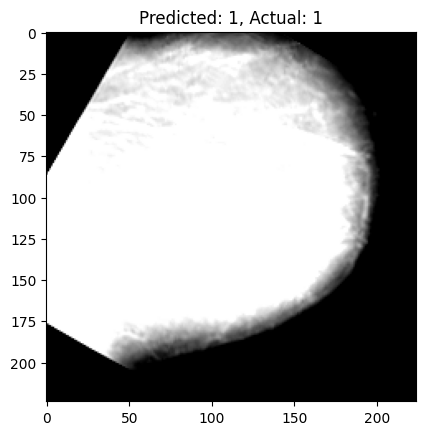

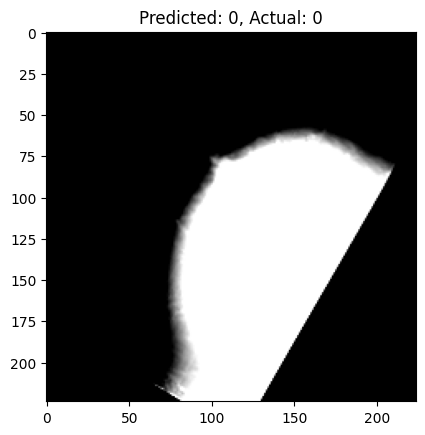

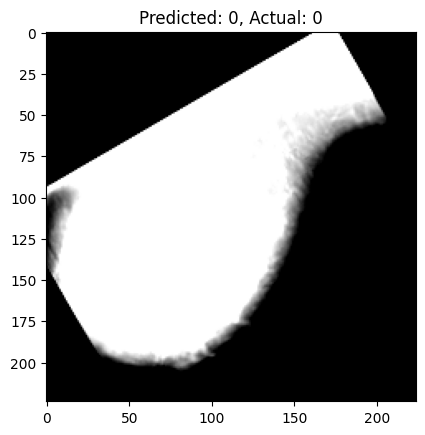

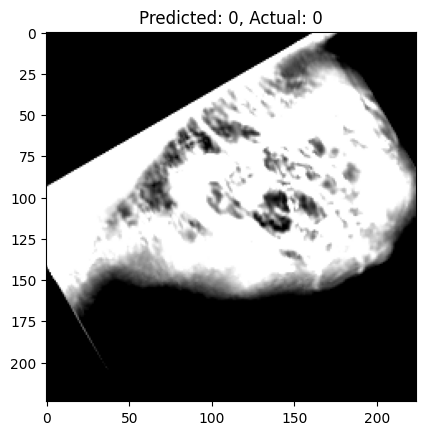

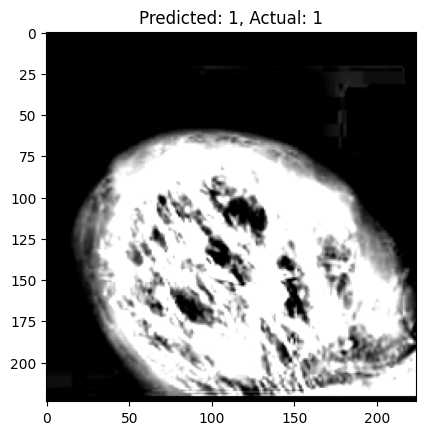

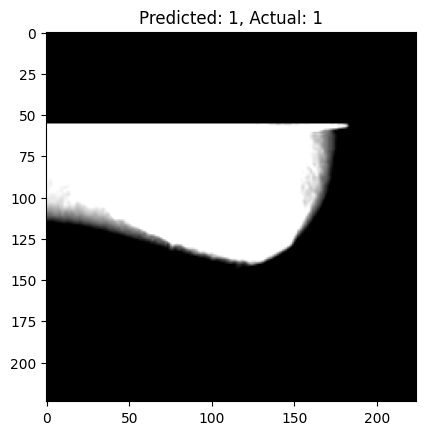

Average Loss:  tensor(0.0009, device='cuda:0')   Accuracy:  304  /  306    99 %
F1 Score is: 0.993312937062937
Classification_Report Score is:               precision    recall  f1-score   support

           0       0.99      0.99      0.99       176
           1       0.99      0.99      0.99       130

    accuracy                           0.99       306
   macro avg       0.99      0.99      0.99       306
weighted avg       0.99      0.99      0.99       306



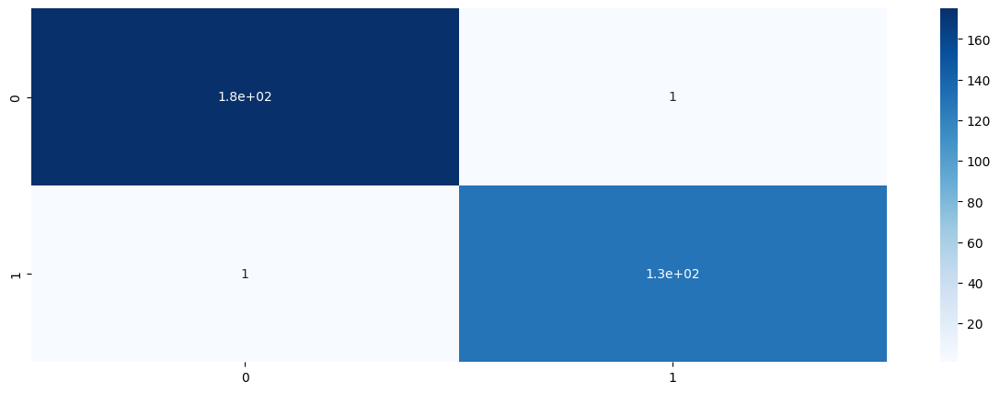

In [ ]:
test(valid_dataloader_mias,model)

#Dataset 2

##About Dataset

In [ ]:
!unzip '/content/drive/MyDrive/cbis-ddsm-breast-cancer-image-dataset.zip'

Streaming output truncated to the last 5000 lines.
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295326067813319071803507885093865003464/1-076.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295334798611650724727702371150477767947/1-265.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295334798611650724727702371150477767947/2-266.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295360926313492745441868049270168300162/1-067.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295394441612082321922200964343746626621/1-002.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295397487412067903910787953980192002590/1-233.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295400289412664594307776853882592114725/1-294.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295400289412664594307776853882592114725/2-223.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295438974411063274614777547962485322182/1-013.jpg  
  inflating: jpeg/1.3.6.1.4.1.9590.100.1.2.295438974411063274614777547962485322182/2-012.jpg  

**Dataset Name:**
CBIS-DDSM: Breast Cancer Image Dataset
https://www.kaggle.com/datasets/awsaf49/cbis-ddsm-breast-cancer-image-dataset

---



---



Curated Breast Imaging Subset DDSM Dataset (Mammography).

Original Dataset (160+ GBs):
https://wiki.cancerimagingarchive.net/pages/viewpage.action?pageId=22516629

##Data preparation

In [ ]:
df = pd.read_csv('/content/csv/calc_case_description_test_set.csv')

In [ ]:
df.columns

Index(['patient_id', 'breast density', 'left or right breast', 'image view',
       'abnormality id', 'abnormality type', 'calc type', 'calc distribution',
       'assessment', 'pathology', 'subtlety', 'image file path',
       'cropped image file path', 'ROI mask file path'],
      dtype='object')

In [ ]:
df.pathology.unique()

array(['BENIGN', 'BENIGN_WITHOUT_CALLBACK', 'MALIGNANT'], dtype=object)